# Заведения общественного питания Москвы

**Цели проекта**
Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут инвесторам в выборе подходящего места для открытия заведения общественного питания в Москве. 


**Описание данных**

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона 
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»
* chain — число, выраженное  0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.


**План работ** 
* Изучить данные
* Выполнить предобработку данных
* Анализ данных
* Детализация исследования: открытие кофейни
* Ссылка на презентацию

## Изучение данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import median
import plotly.express as px
from plotly import graph_objects as go
import json
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth



In [2]:
data=pd.read_csv('moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
display(data['name'].nunique())

5614

На данный момент видим 5614 уникальных записей в столбце с названием заведения, в следующем блоке с предобработкой данных проверим нет ли среди них неявных дубликатов

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Не будем менять тип данных в столбце seats на int тк в столбце есть пропуски значений, которые нечем заменить, вероятнее всего данные по посадочным местам просто отсутствуют

## Предобработка данных

Сначала посмотрим есть ли в данных неявные дубликаты

In [6]:
display(data['name'].sort_values().unique())

array(['#КешбэкКафе', '+39 Pizzeria Mozzarella bar', '1 Этаж', ...,
       'Ясно', 'Яуза', 'ночной Баку'], dtype=object)

In [7]:
display(data.groupby('name')['address'].count().sort_values())

name
#КешбэкКафе           1
Мечта                 1
Метехи                1
Месье Круассан        1
Место хлеба           1
                   ... 
One Price Coffee     71
Додо Пицца           74
Домино'с Пицца       76
Шоколадница         120
Кафе                189
Name: address, Length: 5614, dtype: int64

Преобразуем данные в столбце name:

In [8]:
data['name']=data['name'].str.lower()
to_replace = (
    (' - ', '-'),
    ('   ', ' '),
    ('  ', ' '),
    (' & ', '&'),
)

for old, new in to_replace:
    data['name']=data['name'].str.replace(old, new)


In [9]:
display(data['name'].nunique())

5506

Количество уникальных записей уменьшилось с 5614 до 5506, значит были обнаружены неявные дубликаты

In [10]:
data.duplicated().sum()

0

Явных дубликатов не обнаружено

In [11]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски встречаются в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Не будем их заменять в виду отсутствия данных

Далее добавим столбец с улицей:

In [12]:
data['street']=data['address'].str.split(', ').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [13]:
print(data['hours'].sort_values().unique())

['Нет информации'
 'вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30'
 'вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00' ...
 'чт круглосуточно, перерыв 10:00–20:00; сб круглосуточно'
 'чт-вс 20:00–06:00' nan]


Далее добавим столбец с обозначением того, работает ли заведение ежедневно и круглосуточно

In [14]:
data_hours = data[data['hours'].notna()]
data['is_24/7'] = data_hours['hours'].str.contains('ежедневно, круглосуточно')

data['is_24/7'] = data['is_24/7'].fillna(False)

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

Рассмотрим категории заведений, представленные в данных

In [15]:
print(data['category'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [16]:
data_category = pd.DataFrame(data['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_category['index'], # указываем значения, которые появятся на метках сегментов
                             values=data_category['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество объектов общественного питания по категориям заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Наибольшее количество заведений представлены в категории кафе, также много ресторанов и кофеен

Далее исследуем количество посадочных мест в местах по категориям:

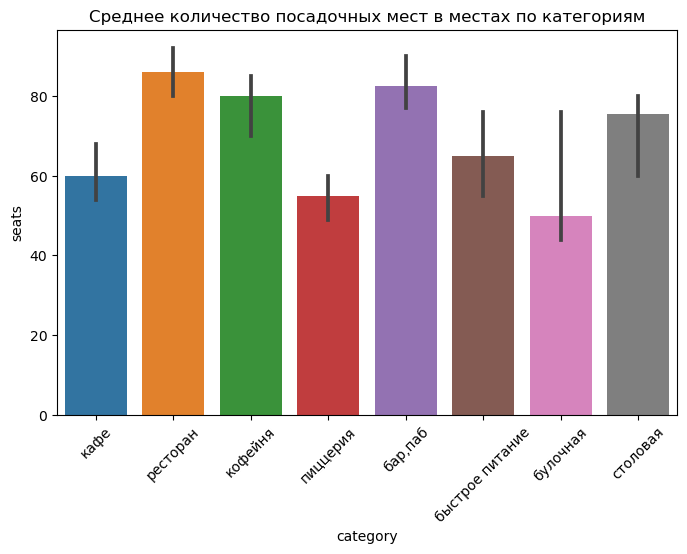

In [17]:
plt.figure(figsize=(8,5))
ax = sns.barplot(x='category', y='seats', data=data, estimator=median) 
plt.xticks(rotation=45)
plt.title('Среднее количество посадочных мест в местах по категориям');

Больше всего посадочных мест в ресторанах, пабах и барах, кофейнях, столовых

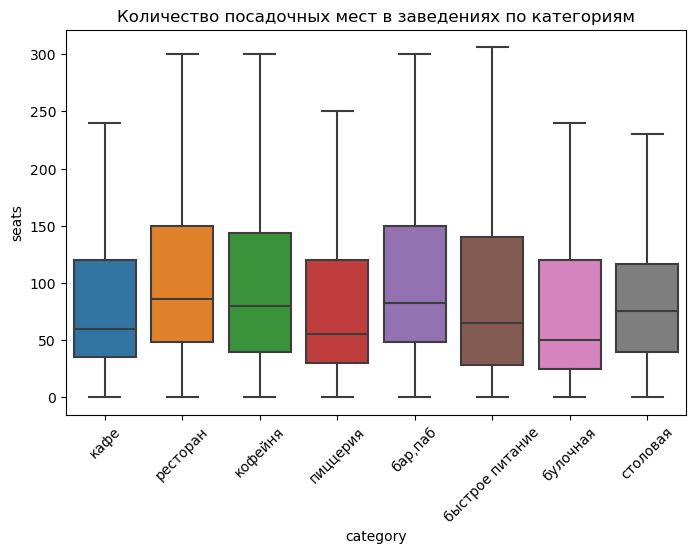

In [18]:
plt.figure(figsize=(8,5))
ax = sns.boxplot(x='category', y='seats', data=data, showfliers=False) 
plt.xticks(rotation=45)
plt.title('Количество посадочных мест в заведениях по категориям');

Самые высокие средние и максимальные значения посадочных мест видим в ресторанах, кофейнях, барах и пабах.

Рассмотрим соотношение сетевых и несетевых заведений в датасете:

In [19]:
data_chain = pd.DataFrame(data['chain'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_chain['index'], # указываем значения, которые появятся на метках сегментов
                             values=data_chain['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество сетевых и несетевых заведений в датасете', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории, где 0-несетевые, 1-сетевые',
                                    showarrow=False)])
fig.show() # выводим график

По количеству заведений несетевых больше

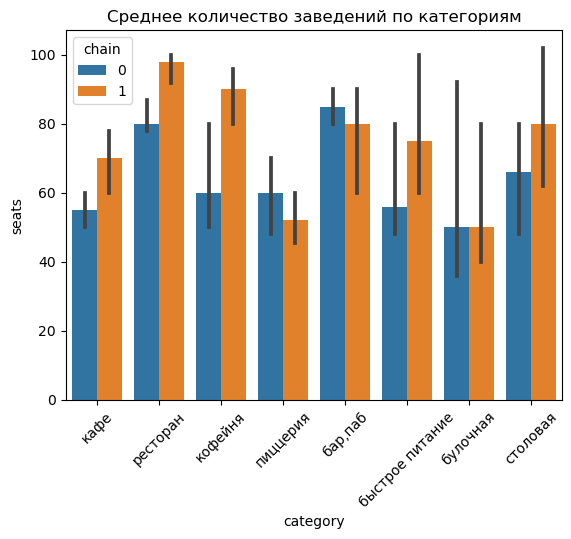

In [20]:
ax = sns.barplot(x='category', y='seats', data=data, hue='chain', estimator=median) 
plt.xticks(rotation=45)
plt.title('Среднее количество заведений по категориям');

По типу заведения кофейни чаще являются сетевыми

Найдем топ-15 популярных сетей в Москве

In [21]:
# отфильтруем данные, сгруппируем по названиям и посчитаем объявления
data_top_15 = data.loc[data['chain'] == 1].groupby('name',)[['name']].count()
# переименуем столбец
data_top_15.columns = ['total_count']
# отсортируем и оставим пять лидеров
data_top_15 = data_top_15.reset_index().sort_values(by='total_count', ascending=False).head(15)
display(data_top_15)

,name,total_count
728,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
741,яндекс лавка,69
58,cofix,65
168,prime,50
663,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


Пострим график

In [22]:
# строим столбчатую диаграмму 
fig = px.bar(data_top_15.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='total_count'# добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей общественного питания в Москве',
                   xaxis_title='Количество заведений в сети',
                   yaxis_title='Название сети заведений')
fig.show() # выводим график

На графике представлены заведения из разных категорий, Шоколадница лидирует с большим отрывом

Далее отобразим количество заведений каждой категории по районам:

In [23]:
# строим гистограммы
fig = px.histogram(data, # загружаем данные
                   x='district', # указываем столбец с данными для оси X
                   color='category', # обозначаем категорию для разделения цветом
                   range_x=[-1, 9], # ограничиваем ось X
                   title='Распределение количества заведений в зависимости от расположения', # указываем заголовок
                   nbins=1000, # назначаем число корзин
                   barmode='stack') # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Значение') # подпись для оси X
fig.update_yaxes(title_text='Количество') # подпись для оси Y
fig.show() # выводим график

Наибольшее количество заведений сосредоточено в ЦАО, если рассматривать в ЦАО эти заведения по категориям, то наибольшая доля принадлежит ресторанам, далее идет примерно одинаковое большое количество кафе, кофеен, баров и пабов.

Далее изучим средние рейтинги по категориям заведений:

In [24]:
data_rating = data.groupby(['category'], \
                        as_index = False)[['rating']].median()
data_rating


,category,rating
0,"бар,паб",4.4
1,булочная,4.3
2,быстрое питание,4.2
3,кафе,4.2
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3


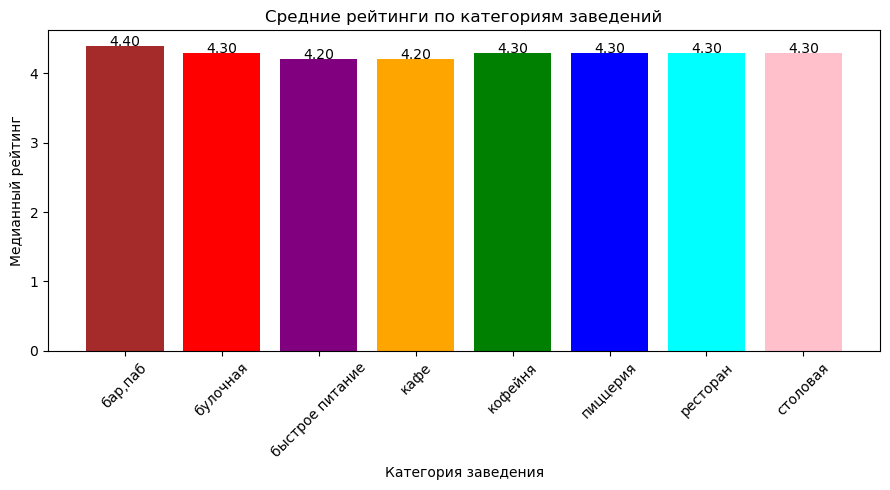

In [25]:
data_rating = data.groupby(['category'], \
                        as_index = False)[['rating']].median()

plt.figure(figsize=(9, 5))

plt.clf()

# using some dummy data for this example
xs = data_rating['category']
ys = data_rating['rating']

plt.bar(xs,ys, color=['brown', 'red','purple', 'orange', 'green', 'blue', 'cyan', 'pink'])


# zip joins x and y coordinates in pairs
for x,y in zip(xs,ys):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # these are the coordinates to position the label
                 textcoords="offset points", # how to position the text
                 xytext=(0,0), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Cредние рейтинги по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Медианный рейтинг')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
labels=data_rating['rating']
rects2 = ax.bar(data_rating['rating'], 10)
ax.bar_label(rects2, padding=3)
plt.tight_layout()
ax.legend(fontsize=10)
plt.show()


Видим, что медианные рейтинги не сильно отличаются по категориям заведений

Далее построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района:

In [26]:
#для построения хороплета сначала выведем средние рейтинги по районам
rating_district = data.groupby('district', as_index=False)['rating'].agg('median')
display(rating_district.sort_values(by='rating', ascending=False))

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [27]:
def choroplet (datas, columns_list, legend_names):
    # загружаем JSON-файл с границами округов Москвы
    state_geo = 'admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423

    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=datas,
        columns=columns_list,
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=legend_names,
    ).add_to(m)

    # выводим карту
    return m

In [28]:
choroplet(rating_district, ['district', 'rating'], 'Медианный рейтинг заведений по районам')


Наблюдаем самый высокий средний рейтинг в Центральном административном округе

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium:

In [29]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

In [30]:
# отфильтруем данные, сгруппируем по городам и посчитаем объявления
data_street_count = data.groupby('street')[['street']].count()
# переименуем столбец
data_street_count.columns = ['total_count']
# отсортируем и оставим 15 лидеров
data_streets_count = data_street_count.reset_index().sort_values(by='total_count', ascending=False).head(15)
display(data_streets_count)

,street,total_count
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [31]:
#сделаем срез данных по нужным улицам
data_street_15=data.query('street in ["проспект Мира", "Профсоюзная улица", "проспект Вернадского", "Ленинский проспект", "Ленинградский проспект", "Дмитровское шоссе", "Каширское шоссе", "Варшавское шоссе", "Ленинградское шоссе", "МКАД", "Люблинская улица", "улица Вавилова", "Кутузовский проспект", "улица Миклухо-Маклая", "Пятницкая улица"]')
data_streets= data_street_15.groupby(['street', 'category'], \
                        as_index = False)[['name']].count()

In [32]:
# строим столбчатую диаграмму 
fig = px.bar(data_streets.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='street',
             color='category',# указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 улиц по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица')
fig.show() # выводим график

Больше всего заведений на Проспекте мира, где по типу заведений больше всего кафе, ресторанов, кофеен

Далее найдем улицы, на которых находится только один объект общепита:

In [33]:
data_street_counts = data_street_count.reset_index().sort_values(by='total_count', ascending=False)
data_street_counts=data_street_counts.loc[data_street_counts['total_count'] == 1]
display(data_street_counts)

,street,total_count
1421,улица Фотиевой,1
1418,улица Фадеева,1
1233,улица Кирпичные Выемки,1
1092,сад Эрмитаж,1
1220,улица Ивана Франко,1
...,...,...
709,Павелецкая набережная,1
712,Панкратьевский переулок,1
716,Парусный проезд,1
717,Певческий переулок,1


В Москве 458 улиц с 1 заведением общественного питания, отфильтруем исходный датасет по этим улицам, выведем названия улиц и посмотрим где они находятся:

In [34]:
street_list=list(data_street_counts['street'])
print(street_list)
filtered_data=data[data['street'].isin(street_list)]

['улица Фотиевой', 'улица Фадеева', 'улица Кирпичные Выемки', 'сад Эрмитаж', 'улица Ивана Франко', 'улица Капотня', 'улица Шухова', 'улица Ильинка', 'улица Юннатов', 'улица Академика Комарова', 'улица 8 Марта', 'улица Шкулёва 4', 'улица Комдива Орлова', 'улица Клочкова', 'улица Кондратюка', 'улица Константина Федина', 'ул. Ярославская', 'улица Кашёнкин Луг', 'улица Чистова', 'ул. Профсоюзная', 'сквер имени М.И. Калинина', 'улица Зорге', 'улица 800-летия Москвы', 'улица Климашкина', 'улица Чечулина', 'улица Академика Ильюшина', 'улица Айвазовского', 'улица Шкулёва', 'улица Костякова', 'улица Конёнкова', 'улица Саморы Машела', 'улица Уткина', 'улица Большая Молчановка', 'улица Буженинова', 'улица Поликарпова', 'улица Полины Осипенко', 'улица Гастелло', 'улица Гашека', 'улица Маршала Соколовского', 'улица Раевского', 'улица Усиевича', 'улица Богородский Вал', 'улица Расковой', 'улица Маршала Баграмяна', 'улица Генерала Глаголева', 'улица Генерала Дорохова', 'улица Расплетина', 'улица Габр

In [35]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
filtered_data.apply(create_clusters, axis=1)

# выводим карту
m

Построим фоновую картограмму (хороплет) с средней стоимостью заказа в рублях для каждого района 

In [36]:
#для построения хороплета сначала выведем средней стоимостью заказа в рублях по районам
rating_district_2 = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
display(rating_district_2.sort_values(by='middle_avg_bill', ascending=False))

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [37]:
choroplet(rating_district_2, ['district', 'middle_avg_bill'], 'Средняя стоимость заказа в рублях по районам')

Самая высокая стоимость заказа наблюдается в заведениях в центре и на западе Москвы

**Выводы**
* Наибольшее количество заведений представлены в категории кафе, также много ресторанов и кофеен.
* Больше всего посадочных мест в ресторанах, пабах и барах, кофейнях, столовых.
* По количеству заведений несетевых больше. По типу заведения кофейни чаще являются сетевыми.
* Среди сетевых заведений по количеству заведений в сети Шоколадница лидирует с большим отрывом
* Наибольшее количество заведений сосредоточено в ЦАО, если рассматривать в ЦАО эти заведения по категориям, то наибольшая доля принадлежит ресторанам, далее идет примерно одинаковое большое количество кафе, кофеен, баров и пабов.
* Средние рейтинги не сильно отличаются по категориям заведений
* Самый высокий средний рейтинг у заведений, находящихся в Центральном административном округе
* Больше всего заведений на Проспекте мира, где по типу заведений больше всего кафе, ресторанов, кофеен
* Самая высокая стоимость заказа наблюдается в заведениях в центре и на западе Москвы

## Детализация исследования: открытие кофейни

Проанализируем сколько всего кофеен в датасете:

In [38]:
coffee_houses=data.loc[data['category'] == 'кофейня']
print(coffee_houses['name'].nunique())

824


Всего в датасете 824 кофейни

Посмотрим в каких районах их больше всего и как они расположены:

In [39]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_houses.apply(create_clusters, axis=1)

# выводим карту
m

In [40]:
coffee_houses_district=coffee_houses.groupby('district', as_index=False)['name'].agg('count')
coffee_houses_district.columns = ['district','quantity']
coffee_houses_district=coffee_houses_district.sort_values(by='quantity', ascending=False)
display(coffee_houses_district)

,district,quantity
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Больше всего кофеен находится в Центральном административном округе, меньше всего в Северо-Западном административном округе

Проверим есть ли круглосуточные кофейни:

In [41]:
cofee_houses_day_and_night=coffee_houses.loc[coffee_houses['is_24/7'] == True]
print(cofee_houses_day_and_night['name'].nunique())

22


В датасете 22 круглосуточных кофейни

Далее проанализируем рейтинги кофеен по районам:

In [42]:
rating_coffee_houses = coffee_houses.groupby('district', as_index=False)['rating'].agg('median')
display(rating_coffee_houses.sort_values(by='rating', ascending=False))

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [43]:
choroplet(rating_coffee_houses, ['district', 'rating'], 'Медианный рейтинг кофеин по районам')


Более низкие рейтинги у кофеен в Западном административном округе

Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни в зависимости от района:

In [44]:
average_cappuccino = coffee_houses.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
average_cappuccino=average_cappuccino.sort_values(by='middle_coffee_cup', ascending=False)
average_cappuccino 

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Самая высокая стоимость чашки капучино в Юго-Западном, Центральном, Западном административных округах, самая низкая в Восточном административном округе

**Вывод:** Лучше открыть кофейню в Юго-Западном административном округе так как наибольшая стоимость чашки капучино в ЮЗАО, ЦАО, ЗАО, но в ЗАО низкий средний рейтинг кофеен, а в ЦАО уже расположено слишком много кофеен. Для сравнения: в ЮЗАО всего 96 кофеин, а в ЦАО 428.

## Ссылка на презентацию

Презентация: <https://docs.google.com/presentation/d/1pUDwfFrg3xMlVeXr6_HBnFI0GObBdU-m/edit?usp=share_link&ouid=106642702332003433596&rtpof=true&sd=true> 